<a href="https://www.kaggle.com/code/sohailaibrahim/accidentmodels-5b6ea3?scriptVersionId=176736988" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import pandas as pd 
import numpy as np 
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
from sklearn.metrics import accuracy_score, recall_score, precision_score, confusion_matrix, classification_report

In [2]:
accident_data = pd.read_csv('/kaggle/input/uk-accidents-10-years-history-with-many-variables/Accidents0514.csv')
vehicles_data = pd.read_csv('/kaggle/input/uk-accidents-10-years-history-with-many-variables/Vehicles0514.csv')
casualties_data = pd.read_csv('/kaggle/input/uk-accidents-10-years-history-with-many-variables/Casualties0514.csv')

In [3]:
vehicles_data.columns

Index(['Accident_Index', 'Vehicle_Reference', 'Vehicle_Type',
       'Towing_and_Articulation', 'Vehicle_Manoeuvre',
       'Vehicle_Location-Restricted_Lane', 'Junction_Location',
       'Skidding_and_Overturning', 'Hit_Object_in_Carriageway',
       'Vehicle_Leaving_Carriageway', 'Hit_Object_off_Carriageway',
       '1st_Point_of_Impact', 'Was_Vehicle_Left_Hand_Drive?',
       'Journey_Purpose_of_Driver', 'Sex_of_Driver', 'Age_of_Driver',
       'Age_Band_of_Driver', 'Engine_Capacity_(CC)', 'Propulsion_Code',
       'Age_of_Vehicle', 'Driver_IMD_Decile', 'Driver_Home_Area_Type'],
      dtype='object')

In [4]:
accident_data.shape

(1640597, 32)

In [5]:
accident_data.columns

Index(['Accident_Index', 'Location_Easting_OSGR', 'Location_Northing_OSGR',
       'Longitude', 'Latitude', 'Police_Force', 'Accident_Severity',
       'Number_of_Vehicles', 'Number_of_Casualties', 'Date', 'Day_of_Week',
       'Time', 'Local_Authority_(District)', 'Local_Authority_(Highway)',
       '1st_Road_Class', '1st_Road_Number', 'Road_Type', 'Speed_limit',
       'Junction_Detail', 'Junction_Control', '2nd_Road_Class',
       '2nd_Road_Number', 'Pedestrian_Crossing-Human_Control',
       'Pedestrian_Crossing-Physical_Facilities', 'Light_Conditions',
       'Weather_Conditions', 'Road_Surface_Conditions',
       'Special_Conditions_at_Site', 'Carriageway_Hazards',
       'Urban_or_Rural_Area', 'Did_Police_Officer_Attend_Scene_of_Accident',
       'LSOA_of_Accident_Location'],
      dtype='object')

In [6]:
accident_data.head()

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,...,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location
0,200501BS00001,525680.0,178240.0,-0.191170,51.489096,1,2,1,1,04/01/2005,...,0,1,1,2,2,0,0,1,1,E01002849
1,200501BS00002,524170.0,181650.0,-0.211708,51.520075,1,3,1,1,05/01/2005,...,0,5,4,1,1,0,0,1,1,E01002909
2,200501BS00003,524520.0,182240.0,-0.206458,51.525301,1,3,2,1,06/01/2005,...,0,0,4,1,1,0,0,1,1,E01002857
3,200501BS00004,526900.0,177530.0,-0.173862,51.482442,1,3,1,1,07/01/2005,...,0,0,1,1,1,0,0,1,1,E01002840
4,200501BS00005,528060.0,179040.0,-0.156618,51.495752,1,3,1,1,10/01/2005,...,0,0,7,1,2,0,0,1,1,E01002863


In [7]:
accident_data.describe()

,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Day_of_Week,Local_Authority_(District),...,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident
count,1.640486e+06,1.640486e+06,1.640486e+06,1.640486e+06,1.640597e+06,1.640597e+06,1.640597e+06,1.640597e+06,1.640597e+06,1.640597e+06,...,1.640597e+06,1.640597e+06,1.640597e+06,1.640597e+06,1.640597e+06,1.640597e+06,1.640597e+06,1.640597e+06,1.640597e+06,1.640597e+06
mean,4.396051e+05,2.992476e+05,-1.436955e+00,5.258114e+01,3.082617e+01,2.838592e+00,1.831300e+00,1.351167e+00,4.117038e+00,3.540821e+02,...,3.795958e+02,9.437418e-03,7.288530e-01,1.950406e+00,1.581204e+00,1.363473e+00,1.099368e-01,7.308498e-02,1.357430e+00,1.193024e+00
std,9.550360e+04,1.614937e+05,1.404020e+00,1.454157e+00,2.554203e+01,4.017734e-01,7.152789e-01,8.260983e-01,1.924815e+00,2.593715e+02,...,1.300225e+03,1.280032e-01,1.808608e+00,1.648006e+00,1.652381e+00,6.296258e-01,7.331669e-01,6.229790e-01,4.794250e-01,4.007670e-01
min,6.495000e+04,1.029000e+04,-7.516225e+00,4.991294e+01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,-1.000000e+00,-1.000000e+00,-1.000000e+00,1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,1.000000e+00,-1.000000e+00
25%,3.754842e+05,1.781200e+05,-2.367761e+00,5.148886e+01,7.000000e+00,3.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,1.220000e+02,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
50%,4.403800e+05,2.666200e+05,-1.398668e+00,5.229034e+01,3.100000e+01,3.000000e+00,2.000000e+00,1.000000e+00,4.000000e+00,3.280000e+02,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
75%,5.230200e+05,3.969900e+05,-2.216495e-01,5.346786e+01,4.600000e+01,3.000000e+00,2.000000e+00,1.000000e+00,6.000000e+00,5.320000e+02,...,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00,1.000000e+00,2.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,1.000000e+00
max,6.555400e+05,1.208800e+06,1.762010e+00,6.075754e+01,9.800000e+01,3.000000e+00,6.700000e+01,9.300000e+01,7.000000e+00,9.410000e+02,...,9.999000e+03,2.000000e+00,8.000000e+00,7.000000e+00,9.000000e+00,5.000000e+00,7.000000e+00,7.000000e+00,3.000000e+00,3.000000e+00


In [8]:
accident_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1640597 entries, 0 to 1640596
Data columns (total 32 columns):
 #   Column                                       Non-Null Count    Dtype  
---  ------                                       --------------    -----  
 0   Accident_Index                               1640597 non-null  object 
 1   Location_Easting_OSGR                        1640486 non-null  float64
 2   Location_Northing_OSGR                       1640486 non-null  float64
 3   Longitude                                    1640486 non-null  float64
 4   Latitude                                     1640486 non-null  float64
 5   Police_Force                                 1640597 non-null  int64  
 6   Accident_Severity                            1640597 non-null  int64  
 7   Number_of_Vehicles                           1640597 non-null  int64  
 8   Number_of_Casualties                         1640597 non-null  int64  
 9   Date                                         1

In [9]:
# Identify columns that contain data for the years 2005 and 2006
columns_to_drop = [col for col in accident_data.columns if '2005' in col or '2006' in col]

# Drop the identified columns
accident_data = accident_data.drop(columns=columns_to_drop)

In [10]:
# Convert 'Date' column to datetime format with correct format
accident_data['Date'] = pd.to_datetime(accident_data['Date'], format='%d/%m/%Y')

# Extract the year from the 'Date' column
accident_data['Year'] = accident_data['Date'].dt.year

# Identify rows where the year is 2005 or 2006
rows_2005_2006 = accident_data[(accident_data['Year'] == 2005) | (accident_data['Year'] == 2006) | (accident_data['Year'] == 2007) | (accident_data['Year'] == 2008)]

# Print the number of rows containing the years 2005 or 2006
print("Number of rows containing these years :", len(rows_2005_2006))


Number of rows containing these years : 740602


In [11]:
# Get the indices of rows containing the years 2005, 2006, 2007, and 2008
indices_to_drop = accident_data[(accident_data['Year'] == 2005) | (accident_data['Year'] == 2006) | (accident_data['Year'] == 2007) | (accident_data['Year'] == 2008)].index

# Drop the rows based on the indices
accident_data.drop(indices_to_drop, inplace=True)

# Print the updated shape of the DataFrame
print("Shape of DataFrame after dropping rows:", accident_data.shape)

Shape of DataFrame after dropping rows: (899995, 33)


In [12]:
# Get the indices of rows containing the years 2005, 2006, 2007, and 2008
indices_to_drop = accident_data[(accident_data['Year'] == 2009) | (accident_data['Year'] == 2010)].index

# Drop the rows based on the indices
accident_data.drop(indices_to_drop, inplace=True)

# Print the updated shape of the DataFrame
print("Shape of DataFrame after dropping rows:", accident_data.shape)

Shape of DataFrame after dropping rows: (582027, 33)


In [13]:
vehicles_data.columns

Index(['Accident_Index', 'Vehicle_Reference', 'Vehicle_Type',
       'Towing_and_Articulation', 'Vehicle_Manoeuvre',
       'Vehicle_Location-Restricted_Lane', 'Junction_Location',
       'Skidding_and_Overturning', 'Hit_Object_in_Carriageway',
       'Vehicle_Leaving_Carriageway', 'Hit_Object_off_Carriageway',
       '1st_Point_of_Impact', 'Was_Vehicle_Left_Hand_Drive?',
       'Journey_Purpose_of_Driver', 'Sex_of_Driver', 'Age_of_Driver',
       'Age_Band_of_Driver', 'Engine_Capacity_(CC)', 'Propulsion_Code',
       'Age_of_Vehicle', 'Driver_IMD_Decile', 'Driver_Home_Area_Type'],
      dtype='object')

In [14]:
!pip install xlrd

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 3.2 MB/s eta 0:00:00


In [15]:
# Read the Excel file and sheet
casualty_severity = pd.read_excel("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Road-Accident-Safety-Data-Guide.xls", sheet_name="Accident Severity")

# Perform left join
accident_data = pd.merge(accident_data, casualty_severity, left_on="Accident_Severity", right_on="code", how="left")

# Rename the column
accident_data.rename(columns={"label": "accident_severity"}, inplace=True)

# Optionally, remove the temporary variable
del casualty_severity

In [16]:
# Read the Excel file and sheet
location_code = pd.read_excel("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Road-Accident-Safety-Data-Guide.xls", sheet_name="Police Force")

# Perform left join
accident_data = pd.merge(accident_data, location_code, left_on="Police_Force", right_on="code", how="left")

# Rename the column
accident_data.rename(columns={"label": "police_force"}, inplace=True)

# Optionally, remove the temporary variable
del location_code


In [17]:
# Read the Excel file and sheet
junction_type = pd.read_excel("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Road-Accident-Safety-Data-Guide.xls", sheet_name="Junction Detail")

# Perform left join
accident_data = pd.merge(accident_data, junction_type, left_on="Junction_Detail", right_on="code", how="left")

# Rename the column
accident_data.rename(columns={"label": "Junction_details"}, inplace=True)

# Optionally, remove the temporary variable
del junction_type


In [18]:
# Read the Excel file and sheet
light_conditions = pd.read_excel("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Road-Accident-Safety-Data-Guide.xls", sheet_name="Light Conditions")

# Perform left join with specified suffixes
accident_data = pd.merge(accident_data, light_conditions, left_on="Light_Conditions", right_on="code", how="left", suffixes=('_main', '_light'))

# Rename the column
accident_data.rename(columns={"label_light": "Light_condition"}, inplace=True)

# Optionally, remove the temporary variable
del light_conditions


In [19]:
# Read the weather conditions data
weather_conditions = pd.read_excel("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Road-Accident-Safety-Data-Guide.xls", sheet_name="Weather")

# Perform left join to map weather condition codes to labels
accident_data = pd.merge(accident_data, weather_conditions, left_on="Weather_Conditions", right_on="code", how="left")

# Rename the column
accident_data.rename(columns={"label": "Weather_condition"}, inplace=True)

# Optionally, remove the temporary variable
del weather_conditions


In [20]:
# Read the surface conditions data
surface_conditions = pd.read_excel("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Road-Accident-Safety-Data-Guide.xls", sheet_name="Road Surface")

# Perform left join to map road surface condition codes to labels
accident_data = pd.merge(accident_data, surface_conditions, left_on="Road_Surface_Conditions", right_on="code", how="left", suffixes=('_left', '_right'))

# Rename the column
accident_data.rename(columns={"label": "road_surface_condition"}, inplace=True)

# Optionally, remove the temporary variable
del surface_conditions


In [21]:
# vehicle_type = pd.read_excel("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Road-Accident-Safety-Data-Guide.xls", sheet_name="Vehicle Type")

# # Perform left join to map vehicle type codes to labels
# df = pd.concat(accident_data, vehicle_type, left_on="LSOA_of_Accident_Location", right_on="code", how="left")

# # Rename the column
# df.rename(columns={"label": "Vehicle_type"}, inplace=True)

# # Optionally, remove the temporary variable
# del vehicle_type

In [22]:
# vehicles_data = pd.read_csv('/kaggle/input/uk-accidents-10-years-history-with-many-variables/Vehicles0514.csv')
# vehicles_data.shape
# vehicles_data.columns

In [23]:
# Casualties_data = pd.read_csv('/kaggle/input/uk-accidents-10-years-history-with-many-variables/Casualties0514.csv')
# Casualties_data.shape
# Casualties_data.columns

In [24]:

# # Merge only the specific column from casualties_data to accident_data
# accident_data_final = pd.merge(accident_data, vehicles_data[['Accident_Index', 'Vehicle_Type','Sex_of_Driver','Age_of_Driver','Journey_Purpose_of_Driver']], on='Accident_Index', how='left')
# accident_data_final = pd.merge(accident_data, Casualties_data[['Accident_Index','Casualty_Severity']], on='Accident_Index', how='left')

# # Drop duplicate columns after merge
# accident_data_final = accident_data_final.loc[:,~accident_data_final.columns.duplicated()]

# # Rename the merged column if needed
# #accident_data = accident_data.rename(columns={'specific_column': 'new_column_name'})


In [25]:
# accident_data_final.shape

In [26]:
accident_data.shape
accident_data.head()

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,...,code_y,police_force,code_main,Junction_details,code_light,label_x,code_left,label_y,code_right,road_surface_condition
0,201101BS70001,525590.0,178980.0,-0.192203,51.495766,1,3,1,1,2011-01-13,...,1,Metropolitan Police,6,Crossroads,4,Darkness - lights lit,2,Raining no high winds,2,Wet or damp
1,201101BS70002,527450.0,179020.0,-0.165408,51.495710,1,2,2,1,2011-01-11,...,1,Metropolitan Police,3,T or staggered junction,4,Darkness - lights lit,1,Fine no high winds,2,Wet or damp
2,201101BS70003,527120.0,178350.0,-0.170401,51.489763,1,3,1,1,2011-01-19,...,1,Metropolitan Police,0,Not at junction or within 20 metres,4,Darkness - lights lit,1,Fine no high winds,1,Dry
3,201101BS70005,525400.0,179210.0,-0.194856,51.497875,1,3,2,3,2011-01-25,...,1,Metropolitan Police,2,Mini-roundabout,4,Darkness - lights lit,1,Fine no high winds,1,Dry
4,201101BS70007,526280.0,177540.0,-0.182783,51.482671,1,3,2,1,2011-01-06,...,1,Metropolitan Police,0,Not at junction or within 20 metres,4,Darkness - lights lit,1,Fine no high winds,2,Wet or damp


In [27]:
columns_to_drop = ['code_x','code_y','code_main','code_light','code_left','code_right']

accident_data = accident_data.drop(columns=columns_to_drop)

In [28]:
accident_data.columns

Index(['Accident_Index', 'Location_Easting_OSGR', 'Location_Northing_OSGR',
       'Longitude', 'Latitude', 'Police_Force', 'Accident_Severity',
       'Number_of_Vehicles', 'Number_of_Casualties', 'Date', 'Day_of_Week',
       'Time', 'Local_Authority_(District)', 'Local_Authority_(Highway)',
       '1st_Road_Class', '1st_Road_Number', 'Road_Type', 'Speed_limit',
       'Junction_Detail', 'Junction_Control', '2nd_Road_Class',
       '2nd_Road_Number', 'Pedestrian_Crossing-Human_Control',
       'Pedestrian_Crossing-Physical_Facilities', 'Light_Conditions',
       'Weather_Conditions', 'Road_Surface_Conditions',
       'Special_Conditions_at_Site', 'Carriageway_Hazards',
       'Urban_or_Rural_Area', 'Did_Police_Officer_Attend_Scene_of_Accident',
       'LSOA_of_Accident_Location', 'Year', 'accident_severity',
       'police_force', 'Junction_details', 'label_x', 'label_y',
       'road_surface_condition'],
      dtype='object')

In [29]:
col_drop =['Police_Force','Accident_Severity','Junction_Detail','Road_Surface_Conditions','Weather_Conditions','Light_Conditions']
accident_data = accident_data.drop(columns=col_drop)
accident_data.rename(columns={'label_x': 'Light_conditions'}, inplace=True)
accident_data.rename(columns={'label_y': 'Weather_conditions'}, inplace=True)
accident_data.head()

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,...,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year,accident_severity,police_force,Junction_details,Light_conditions,Weather_conditions,road_surface_condition
0,201101BS70001,525590.0,178980.0,-0.192203,51.495766,1,1,2011-01-13,5,16:54,...,1,1,E01002812,2011,Slight,Metropolitan Police,Crossroads,Darkness - lights lit,Raining no high winds,Wet or damp
1,201101BS70002,527450.0,179020.0,-0.165408,51.495710,2,1,2011-01-11,3,19:45,...,1,1,E01002819,2011,Serious,Metropolitan Police,T or staggered junction,Darkness - lights lit,Fine no high winds,Wet or damp
2,201101BS70003,527120.0,178350.0,-0.170401,51.489763,1,1,2011-01-19,4,17:30,...,1,1,E01002914,2011,Slight,Metropolitan Police,Not at junction or within 20 metres,Darkness - lights lit,Fine no high winds,Dry
3,201101BS70005,525400.0,179210.0,-0.194856,51.497875,2,3,2011-01-25,3,23:40,...,1,1,E01002813,2011,Slight,Metropolitan Police,Mini-roundabout,Darkness - lights lit,Fine no high winds,Dry
4,201101BS70007,526280.0,177540.0,-0.182783,51.482671,2,1,2011-01-06,5,06:20,...,1,2,E01002913,2011,Slight,Metropolitan Police,Not at junction or within 20 metres,Darkness - lights lit,Fine no high winds,Wet or damp


In [30]:
columns_with_minus_one = accident_data.columns[(accident_data == -1).any()].tolist()

print("Columns containing -1:")
print(columns_with_minus_one)

Columns containing -1:
['Junction_Control', '2nd_Road_Class', '2nd_Road_Number', 'Special_Conditions_at_Site', 'Carriageway_Hazards', 'Did_Police_Officer_Attend_Scene_of_Accident']


In [31]:
accident_data.replace(-1, 'NaN', inplace=True)
accident_data.replace(-1, 'NaN', inplace=True)
accident_data.replace(-1, 'NaN', inplace=True)

In [32]:
columns_with_minus_one = accident_data.columns[(accident_data == -1).any()].tolist()

print("Columns containing -1:")
print(columns_with_minus_one)

Columns containing -1:
[]


In [33]:
accident_data.describe()

,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Local_Authority_(District),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Urban_or_Rural_Area,Year
count,582027.000000,5.820270e+05,582027.000000,582027.000000,582027.000000,582027.000000,582027,582027.000000,582027.000000,582027.000000,582027.000000,582027.000000,582027.000000,582027.000000,582027.000000,582027.000000,582027.000000
mean,444418.928661,2.942167e+05,-1.366800,52.535587,1.827187,1.336398,2012-12-28 11:41:28.653618944,4.113081,348.647709,4.075253,1010.866281,5.170224,38.450158,0.008348,0.818393,1.345451,2012.480785
min,65510.000000,1.029000e+04,-7.509162,49.912941,1.000000,1.000000,2011-01-01 00:00:00,1.000000,1.000000,1.000000,0.000000,1.000000,10.000000,0.000000,0.000000,1.000000,2011.000000
25%,381621.500000,1.769465e+05,-2.276247,51.478927,1.000000,1.000000,2011-12-15 00:00:00,2.000000,110.000000,3.000000,0.000000,6.000000,30.000000,0.000000,0.000000,1.000000,2011.000000
50%,448030.000000,2.500800e+05,-1.292820,52.137234,2.000000,1.000000,2012-12-14 00:00:00,4.000000,328.000000,3.000000,143.000000,6.000000,30.000000,0.000000,0.000000,1.000000,2012.000000
75%,525770.000000,3.935820e+05,-0.187501,53.436655,2.000000,1.000000,2014-01-03 00:00:00,6.000000,530.000000,6.000000,769.000000,6.000000,40.000000,0.000000,0.000000,2.000000,2014.000000
max,655370.000000,1.198000e+06,1.759382,60.662043,67.000000,93.000000,2014-12-31 00:00:00,7.000000,941.000000,6.000000,9999.000000,9.000000,70.000000,2.000000,8.000000,2.000000,2014.000000
std,95378.611889,1.603801e+05,1.401465,1.444234,0.709928,0.831399,NaN,1.916280,259.736511,1.415030,1806.777345,1.639037,13.887487,0.119291,1.908511,0.475516,1.128246


In [34]:
accident_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 582027 entries, 0 to 582026
Data columns (total 33 columns):
 #   Column                                       Non-Null Count   Dtype         
---  ------                                       --------------   -----         
 0   Accident_Index                               582027 non-null  object        
 1   Location_Easting_OSGR                        582027 non-null  float64       
 2   Location_Northing_OSGR                       582027 non-null  float64       
 3   Longitude                                    582027 non-null  float64       
 4   Latitude                                     582027 non-null  float64       
 5   Number_of_Vehicles                           582027 non-null  int64         
 6   Number_of_Casualties                         582027 non-null  int64         
 7   Date                                         582027 non-null  datetime64[ns]
 8   Day_of_Week                                  582027 non-null  in

In [35]:
cleaned_accident_data =accident_data.copy()
cleaned_accident_data.shape

(582027, 33)

In [36]:
# Check for missing values in the entire DataFrame
missing_values = cleaned_accident_data.isnull()

# Count the number of missing values in each column
missing_counts = cleaned_accident_data.isnull().sum()

# Calculate the percentage of missing values in each column
missing_percentages = (cleaned_accident_data.isnull().sum() / len(cleaned_accident_data)) * 100

# Print the results
print("Missing value counts:")
print(missing_counts)
print("\nMissing value percentages:")
print(missing_percentages)

Missing value counts:
Accident_Index                                     0
Location_Easting_OSGR                              0
Location_Northing_OSGR                             0
Longitude                                          0
Latitude                                           0
Number_of_Vehicles                                 0
Number_of_Casualties                               0
Date                                               0
Day_of_Week                                        0
Time                                              25
Local_Authority_(District)                         0
Local_Authority_(Highway)                          0
1st_Road_Class                                     0
1st_Road_Number                                    0
Road_Type                                          0
Speed_limit                                        0
Junction_Control                                   0
2nd_Road_Class                                     0
2nd_Road_Number         

In [37]:
# Remove rows with missing values
cleaned_accident_data = cleaned_accident_data.dropna()

# Remove columns with missing values
cleaned_accident_data = cleaned_accident_data.dropna(axis=1)

In [38]:
cleaned_accident_data.isnull().sum()

Accident_Index                                 0
Location_Easting_OSGR                          0
Location_Northing_OSGR                         0
Longitude                                      0
Latitude                                       0
Number_of_Vehicles                             0
Number_of_Casualties                           0
Date                                           0
Day_of_Week                                    0
Time                                           0
Local_Authority_(District)                     0
Local_Authority_(Highway)                      0
1st_Road_Class                                 0
1st_Road_Number                                0
Road_Type                                      0
Speed_limit                                    0
Junction_Control                               0
2nd_Road_Class                                 0
2nd_Road_Number                                0
Pedestrian_Crossing-Human_Control              0
Pedestrian_Crossing-

In [39]:
shape = cleaned_accident_data.shape
print('data shape after remove nan : ',shape)

data shape after remove nan :  (543332, 33)


In [40]:
# accident_data = accident_data.drop(['Accident_Index', 'Did_Police_Officer_Attend_Scene_of_Accident','Location_Easting_OSGR','Location_Northing_OSGR' ,'Date', 'Time', 'Age_of_Driver','Longitude', 'Latitude', '2nd_Road_Number', '1st_Road_Number','Number_of_Casualties', 'Number_of_Vehicles', 'Month_number', 'Year'], axis = 1)


In [41]:
# Check for duplicated rows
duplicated_rows = cleaned_accident_data.duplicated()

# Select rows that are duplicated
duplicated = cleaned_accident_data[duplicated_rows]

# Print duplicated data
print("Duplicated rows:")
print(duplicated)

Duplicated rows:
Empty DataFrame
Columns: [Accident_Index, Location_Easting_OSGR, Location_Northing_OSGR, Longitude, Latitude, Number_of_Vehicles, Number_of_Casualties, Date, Day_of_Week, Time, Local_Authority_(District), Local_Authority_(Highway), 1st_Road_Class, 1st_Road_Number, Road_Type, Speed_limit, Junction_Control, 2nd_Road_Class, 2nd_Road_Number, Pedestrian_Crossing-Human_Control, Pedestrian_Crossing-Physical_Facilities, Special_Conditions_at_Site, Carriageway_Hazards, Urban_or_Rural_Area, Did_Police_Officer_Attend_Scene_of_Accident, LSOA_of_Accident_Location, Year, accident_severity, police_force, Junction_details, Light_conditions, Weather_conditions, road_surface_condition]
Index: []

[0 rows x 33 columns]


In [42]:
# Drop duplicate rows
cleaned_accident_data.drop_duplicates(inplace=True)

In [43]:
numerical_features=[]
for col in cleaned_accident_data.columns:
    if np.issubdtype(cleaned_accident_data[col].dtype, np.number):
        print(f"{col} is a numerical column.")
        numerical_features.append(col)

Location_Easting_OSGR is a numerical column.
Location_Northing_OSGR is a numerical column.
Longitude is a numerical column.
Latitude is a numerical column.
Number_of_Vehicles is a numerical column.
Number_of_Casualties is a numerical column.
Day_of_Week is a numerical column.
Local_Authority_(District) is a numerical column.
1st_Road_Class is a numerical column.
1st_Road_Number is a numerical column.
Road_Type is a numerical column.
Speed_limit is a numerical column.
Pedestrian_Crossing-Human_Control is a numerical column.
Pedestrian_Crossing-Physical_Facilities is a numerical column.
Urban_or_Rural_Area is a numerical column.
Year is a numerical column.


In [44]:
import plotly.express as px

# Select numerical features for plotting
numerical_features = ['Number_of_Vehicles', 'Speed_limit']

# Create box plots for each numerical feature
fig = make_subplots(rows=len(numerical_features), cols=1, subplot_titles=numerical_features)

for i, feature in enumerate(numerical_features):
    # Create a box plot for the current feature
    boxplot = px.box(cleaned_accident_data, y=feature, title=f'Boxplot of {feature}')
    # Add the box plot to the subplot
    for data in boxplot.data:
        fig.add_trace(data, row=i+1, col=1)

# Update layout and show the figure
fig.update_layout(height=200*len(numerical_features), showlegend=False)
fig.show()

In [45]:
#Dealing With outliers
def remove_outliers(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR 
    upper_bound = Q3 + 1.5 * IQR
    
    return df[(df >= lower_bound) & (df <= upper_bound)]  

In [46]:
cleaned_accident_data[numerical_features] = remove_outliers(cleaned_accident_data[numerical_features]) 

In [47]:
# Categorical features 
categorical_cols = cleaned_accident_data.select_dtypes(include=['object', 'category']).columns 
print(categorical_cols)
print(len(categorical_cols)) 

Index(['Accident_Index', 'Time', 'Local_Authority_(Highway)',
       'Junction_Control', '2nd_Road_Class', '2nd_Road_Number',
       'Special_Conditions_at_Site', 'Carriageway_Hazards',
       'Did_Police_Officer_Attend_Scene_of_Accident',
       'LSOA_of_Accident_Location', 'accident_severity', 'police_force',
       'Junction_details', 'Light_conditions', 'Weather_conditions',
       'road_surface_condition'],
      dtype='object')
16


In [48]:
cleaned_accident_data = cleaned_accident_data.drop(['Accident_Index', 'Did_Police_Officer_Attend_Scene_of_Accident','Location_Easting_OSGR','Location_Northing_OSGR' ,'Date', 'Time','Longitude', 'Latitude', '2nd_Road_Number', '1st_Road_Number','Number_of_Casualties',  'Year'], axis = 1)


In [49]:
cleaned_accident_data = cleaned_accident_data.drop(['LSOA_of_Accident_Location'], axis = 1)

In [50]:
binary_features=[]
for col in cleaned_accident_data.columns:
    unique_vals = cleaned_accident_data[col].nunique()
    if unique_vals < 40:
        print(f"{col}  : has only {unique_vals} unique values and is likely a binary feature.")
        binary_features.append(col) 

Number_of_Vehicles  : has only 3 unique values and is likely a binary feature.
Day_of_Week  : has only 7 unique values and is likely a binary feature.
1st_Road_Class  : has only 6 unique values and is likely a binary feature.
Road_Type  : has only 6 unique values and is likely a binary feature.
Speed_limit  : has only 4 unique values and is likely a binary feature.
Junction_Control  : has only 5 unique values and is likely a binary feature.
2nd_Road_Class  : has only 7 unique values and is likely a binary feature.
Pedestrian_Crossing-Human_Control  : has only 3 unique values and is likely a binary feature.
Pedestrian_Crossing-Physical_Facilities  : has only 6 unique values and is likely a binary feature.
Special_Conditions_at_Site  : has only 8 unique values and is likely a binary feature.
Carriageway_Hazards  : has only 7 unique values and is likely a binary feature.
Urban_or_Rural_Area  : has only 2 unique values and is likely a binary feature.
accident_severity  : has only 3 unique 

In [51]:
categorical_features=[]
for col in cleaned_accident_data.columns:
    if cleaned_accident_data[col].dtype == 'object' or cleaned_accident_data[col].dtype.name == 'category':
        if not np.issubdtype(cleaned_accident_data[col].dtype, np.number):
            unique_vals = cleaned_accident_data[col].nunique()
            if unique_vals > 2:
                print(f"{col} is a non-numeric categorical column with {unique_vals} categories.")
                categorical_features.append(col)

Local_Authority_(Highway) is a non-numeric categorical column with 175 categories.
Junction_Control is a non-numeric categorical column with 5 categories.
2nd_Road_Class is a non-numeric categorical column with 7 categories.
Special_Conditions_at_Site is a non-numeric categorical column with 8 categories.
Carriageway_Hazards is a non-numeric categorical column with 7 categories.
accident_severity is a non-numeric categorical column with 3 categories.
police_force is a non-numeric categorical column with 43 categories.
Junction_details is a non-numeric categorical column with 10 categories.
Light_conditions is a non-numeric categorical column with 5 categories.
Weather_conditions is a non-numeric categorical column with 9 categories.
road_surface_condition is a non-numeric categorical column with 6 categories.


In [52]:
categorical_features

['Local_Authority_(Highway)',
 'Junction_Control',
 '2nd_Road_Class',
 'Special_Conditions_at_Site',
 'Carriageway_Hazards',
 'accident_severity',
 'police_force',
 'Junction_details',
 'Light_conditions',
 'Weather_conditions',
 'road_surface_condition']

In [53]:
for i in categorical_features : 
    print(f"{cleaned_accident_data[i].value_counts()}\n\n")

Local_Authority_(Highway)
E10000016    17237
E10000030    15648
E10000012    12655
E10000017    12249
E10000014    12214
             ...  
W06000024      417
W06000019      389
E06000017      331
EHEATHROW      132
E06000053        8
Name: count, Length: 175, dtype: int64


Junction_Control
4      274634
NaN    207359
2       57996
3        2579
1         764
Name: count, dtype: int64


2nd_Road_Class
6      221642
NaN    211758
3       56159
5       27637
4       22045
1        3678
2         413
Name: count, dtype: int64


Special_Conditions_at_Site
0    531187
4      5731
7      1628
6      1575
5      1345
1       888
3       738
2       240
Name: count, dtype: int64


Carriageway_Hazards
0      534444
2        3409
7        2797
6        1436
3         679
1         566
NaN         1
Name: count, dtype: int64


accident_severity
Slight     461577
Serious     75733
Fatal        6022
Name: count, dtype: int64


police_force
Metropolitan Police    96204
Thames Valley          21736


In [54]:
# Assuming 'Junction_Control' is the column with 'unknown' values
cleaned_accident_data = cleaned_accident_data[cleaned_accident_data['Junction_Control'] != 'NaN']

cleaned_accident_data = cleaned_accident_data[cleaned_accident_data['2nd_Road_Class'] != 'NaN']


In [55]:
for i in categorical_features : 
    print(f"{cleaned_accident_data[i].value_counts()}\n\n")

Local_Authority_(Highway)
E10000016    8866
E10000030    7660
E10000017    7287
E10000014    7005
E08000025    6635
             ... 
W06000024     204
W06000001     201
E06000017     145
EHEATHROW      96
E06000053       2
Name: count, Length: 175, dtype: int64


Junction_Control
4    270232
2     57861
3      2568
1       754
Name: count, dtype: int64


2nd_Road_Class
6    221518
3     56147
5     27627
4     22034
1      3677
2       412
Name: count, dtype: int64


Special_Conditions_at_Site
0    325611
4      2810
6       720
1       666
3       616
5       483
7       312
2       197
Name: count, dtype: int64


Carriageway_Hazards
0    328541
2      1076
6       899
7       510
1       219
3       170
Name: count, dtype: int64


accident_severity
Slight     287709
Serious     41486
Fatal        2220
Name: count, dtype: int64


police_force
Metropolitan Police    74320
West Midlands          14081
Greater Manchester     13330
West Yorkshire         11881
Thames Valley          1159

In [56]:
cleaned_accident_data.shape

(331415, 20)

In [57]:
numerical_features=[]
for col in cleaned_accident_data.columns:
    if np.issubdtype(cleaned_accident_data[col].dtype, np.number):
        print(f"{col} is a numerical column.")
        numerical_features.append(col)

Number_of_Vehicles is a numerical column.
Day_of_Week is a numerical column.
Local_Authority_(District) is a numerical column.
1st_Road_Class is a numerical column.
Road_Type is a numerical column.
Speed_limit is a numerical column.
Pedestrian_Crossing-Human_Control is a numerical column.
Pedestrian_Crossing-Physical_Facilities is a numerical column.
Urban_or_Rural_Area is a numerical column.


In [58]:
cleaned_accident_data['accident_severity']

0          Slight
1         Serious
3          Slight
5          Slight
6          Slight
           ...   
573225    Serious
573226     Slight
573227    Serious
573228     Slight
573236     Slight
Name: accident_severity, Length: 331415, dtype: object

# Scaling

In [59]:
# split data to fit in suprvised ML algorithm 
scaled_data = cleaned_accident_data.copy()
severity_target_scaled = scaled_data['accident_severity']
features_scaled = scaled_data.drop('accident_severity', axis = 1)

In [60]:
# map severity to code: 
severity_target_scaled = severity_target_scaled.map({'Slight':0, 'Serious':1, 'Fatal':2})

In [61]:
# identify categorical feature to get dummay variables: 
catigorical = categorical_features
catigorical.remove('accident_severity')

In [62]:
features_final_scaled = pd.get_dummies(features_scaled, columns = catigorical, drop_first=True)

# Print the number of features after one-hot encoding
encoded = list(features_final_scaled.columns)
print("{} total features after one-hot encoding.".format(len(encoded)))

270 total features after one-hot encoding.


In [63]:
features_final_scaled.columns

Index(['Number_of_Vehicles', 'Day_of_Week', 'Local_Authority_(District)',
       '1st_Road_Class', 'Road_Type', 'Speed_limit',
       'Pedestrian_Crossing-Human_Control',
       'Pedestrian_Crossing-Physical_Facilities', 'Urban_or_Rural_Area',
       'Local_Authority_(Highway)_E06000002',
       ...
       'Weather_conditions_Raining + high winds',
       'Weather_conditions_Raining no high winds',
       'Weather_conditions_Snowing + high winds',
       'Weather_conditions_Snowing no high winds',
       'Weather_conditions_Unknown', 'road_surface_condition_Dry',
       'road_surface_condition_Flood over 3cm. deep',
       'road_surface_condition_Frost or ice', 'road_surface_condition_Snow',
       'road_surface_condition_Wet or damp'],
      dtype='object', length=270)

In [64]:
features_final_scaled = features_final_scaled.astype(np.float64)

In [65]:
features_final_scaled.head()

,Number_of_Vehicles,Day_of_Week,Local_Authority_(District),1st_Road_Class,Road_Type,Speed_limit,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Urban_or_Rural_Area,Local_Authority_(Highway)_E06000002,...,Weather_conditions_Raining + high winds,Weather_conditions_Raining no high winds,Weather_conditions_Snowing + high winds,Weather_conditions_Snowing no high winds,Weather_conditions_Unknown,road_surface_condition_Dry,road_surface_condition_Flood over 3cm. deep,road_surface_condition_Frost or ice,road_surface_condition_Snow,road_surface_condition_Wet or damp
0,1.0,5.0,12.0,5.0,6.0,30.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,2.0,3.0,12.0,5.0,6.0,30.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,2.0,3.0,12.0,6.0,1.0,30.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5,1.0,2.0,12.0,6.0,6.0,30.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,1.0,5.0,12.0,5.0,6.0,30.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [66]:
from sklearn.model_selection import train_test_split

X_scale, X_test, y_scale, y_test = train_test_split(features_final_scaled, severity_target_scaled,
                                        test_size = 0.30, random_state = 2)
X_train, X_val, y_train, y_val = train_test_split(X_scale, y_scale,
                                        test_size = 0.30, random_state = 2)

In [62]:
from sklearn.preprocessing import StandardScaler

sc= StandardScaler()
X_train = sc.fit_transform(X_train)
X_val = sc.transform(X_val)
X_test = sc.transform(X_test)

In [63]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(162393, 270)
(162393,)
(99425, 270)
(99425,)


In [64]:
from sklearn.impute import SimpleImputer

# Create an instance of SimpleImputer with the desired strategy
imputer = SimpleImputer(strategy='mean')  

# Fit the imputer to your training data and transform it
X_train_imputed_scale = imputer.fit_transform(X_train)
X_test_imputed_scale = imputer.fit_transform(X_test)
X_val_imputed_scale = imputer.fit_transform(X_val)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
DT = DecisionTreeClassifier(criterion='gini',
                           max_depth=3,
                           splitter='random',
                           min_samples_split=5)
DT.fit(X_train_imputed_scale, y_train)

In [ ]:
y_pred_dt_train = DT.predict(X_train_imputed_scale)

y_pred_dt_test = DT.predict(X_test_imputed_scale)
# Make predictions on the validation set
y_pred_dt_val = DT.predict(X_val_imputed_scale)
# Compute accuracy for training set
accuracy_train = accuracy_score(y_train, y_pred_dt_train)
print("Accuracy on training set:", accuracy_train)

# Compute accuracy for validation y_pred_dt_val
accuracy_val = accuracy_score(y_val, y_pred_dt_val)
print("Accuracy on validation set:", accuracy_val)

# Compute accuracy for test set
accuracy_test = accuracy_score(y_test, y_pred_dt_test)
print("Accuracy on test set:", accuracy_test)

# Normalization

In [ ]:
# split data to fit in suprvised ML algorithm 
norm_data = cleaned_accident_data.copy()
severity_target = norm_data['accident_severity']
features = norm_data.drop('accident_severity', axis = 1)

In [ ]:
# map severity to code: 
severity_target = severity_target.map({'Slight':0, 'Serious':1, 'Fatal':2})

In [ ]:
# identify categorical feature to get dummay variables: 
#catigorical = categorical_features
#catigorical.remove('accident_severity')

In [ ]:
features_final = pd.get_dummies(features, columns = catigorical, drop_first=True)

# Print the number of features after one-hot encoding
encoded = list(features_final.columns)
print("{} total features after one-hot encoding.".format(len(encoded)))

In [ ]:
features_final.columns

In [ ]:
features_final = features_final.astype(np.float64)

In [ ]:
features_final.head()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
Features_after_normalization= scaler.fit_transform(features_final)

In [ ]:
Features_after_normalization

In [ ]:
from sklearn.model_selection import train_test_split

X, X_test, y, y_test = train_test_split(Features_after_normalization, severity_target,
                                        test_size = 0.30, random_state = 2)
X_train, X_val, y_train, y_val = train_test_split(X, y,
                                        test_size = 0.30, random_state = 2)

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

In [ ]:
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.model_selection import GridSearchCV

# # define the parameter grid to search over
# param_grid = {
#     'criterion': ['gini', 'entropy'],
#     'max_depth': [3, 5,10,15, None],
#      'splitter': ['best', 'random'],
#  }

# # create a decision tree model instance
# dt = DecisionTreeClassifier()

# # create a GridSearchCV instance with the parameter grid and the decision tree model
# grid_search = GridSearchCV(estimator=dt, param_grid=param_grid, cv=5, scoring='accuracy')

# # fit the GridSearchCV instance on the training data
# grid_search.fit(X_train, y_train)
# print(grid_search.best_estimator_)
# y_pred_grid_search = grid_search.predict(X_test)
    
# # print the best hyperparameters and corresponding score
# print("Train Score: ",grid_search.fit(X_train, y_train).score(X_train, y_train))
# print("Validation Accuracy:", accuracy_score(y_val, grid_search.predict(X_val)))
# print("Test Accuracy:", accuracy_score(y_test, y_pred_grid_search))
# print("Best Hyperparameters: ", grid_search.best_params_)
# print("Best Score: ", grid_search.best_score_)

In [ ]:
from sklearn.impute import SimpleImputer

# Create an instance of SimpleImputer with the desired strategy
imputer = SimpleImputer(strategy='mean')  

# Fit the imputer to your training data and transform it
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.fit_transform(X_test)
X_val_imputed = imputer.fit_transform(X_val)

In [ ]:
DT = DecisionTreeClassifier(criterion='gini',
                           max_depth=3,
                           splitter='random',
                           min_samples_split=5)
DT.fit(X_train_imputed, y_train)

In [ ]:
y_pred_DT = DT.predict(X_test_imputed)


In [ ]:

accuracy = accuracy_score(y_test, y_pred_DT)
print("Accuracy:", accuracy)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Create an instance of RandomForestClassifier with optional parameters
rf_classifier = RandomForestClassifier(random_state=9)

# Fit the model to your training data
rf_classifier.fit(X_train_imputed, y_train)

# Use the trained model to make predictions on your test data
y_pred_rf = rf_classifier.predict(X_test_imputed)

In [ ]:
# train_score=accuracy_score(y_train,y_pred_rf)
# print("Ntrain :",train_score)

In [ ]:
accuracy = accuracy_score(y_test, y_pred_rf)
print("Accuracy:", accuracy)

In [ ]:
from sklearn.linear_model import LogisticRegression
# Create an instance of RandomForestClassifier with optional parameters
LR = LogisticRegression(random_state=9)

# Fit the model to your training data
LR.fit(X_train_imputed, y_train)

# Use the trained model to make predictions on your test data
y_pred_lr = LR.predict(X_test_imputed)

In [ ]:
accuracy = accuracy_score(y_test, y_pred_lr)
print("Accuracy:", accuracy)

In [ ]:
from sklearn.naive_bayes import GaussianNB
NB = GaussianNB()

# Fit the model to your training data
NB.fit(X_train_imputed, y_train)

# Use the trained model to make predictions on your test data
y_pred_nb = NB.predict(X_test_imputed)

In [ ]:

accuracy = accuracy_score(y_test, y_pred_nb)
print("Accuracy:", accuracy)

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

ada = AdaBoostClassifier(random_state=9)
# Fit the model to your training data
ada.fit(X_train_imputed, y_train)

y_pred_ada_train = ada.predict(X_train_imputed)

y_pred_ada = ada.predict(X_test_imputed)
# Make predictions on the validation set
y_pred_ada_val = ada.predict(X_val_imputed)


In [ ]:
# Compute accuracy for training set
accuracy_train = accuracy_score(y_train, y_pred_ada_train)
print("Accuracy on training set:", accuracy_train)

# Compute accuracy for validation set
accuracy_val = accuracy_score(y_val, y_pred_ada_val)
print("Accuracy on validation set:", accuracy_val)

# Compute accuracy for test set
accuracy_test = accuracy_score(y_test, y_pred_ada)
print("Accuracy on test set:", accuracy_test)

In [ ]:
print("Recall:", recall_score(y_test, y_pred_ada, average=None))
print("Precision:", precision_score(y_test, y_pred_ada, average=None))

In [ ]:
# from sklearn.svm import SVC
# svc = SVC(random_state=9, class_weight='balanced')

# # Fit the model to your training data
# svc.fit(X_train_imputed, y_train)

# # Use the trained model to make predictions on your test data
# y_pred_scv = NB.predict(X_test_imputed)

In [ ]:
#accuracy = accuracy_score(y_test, y_pred_scv)
#print("Accuracy:", accuracy)

# PCA

In [ ]:
# split data to fit in suprvised ML algorithm 
pca_data = cleaned_accident_data.copy()
severity_target_pca = pca_data['accident_severity']
features_pca = pca_data.drop('accident_severity', axis = 1)

In [ ]:
# map severity to code: 
severity_target_pca = severity_target_pca.map({'Slight':0, 'Serious':1, 'Fatal':2})

In [ ]:
categorical_features

In [ ]:
# identify categorical feature to get dummay variables: 
catigorical = categorical_features
#catigorical.remove('accident_severity')
features_final_pca = pd.get_dummies(features_pca, columns = catigorical, drop_first=True)

# Print the number of features after one-hot encoding
encoded = list(features_final_pca.columns)
print("{} total features after one-hot encoding.".format(len(encoded)))

In [ ]:
features_final_pca = features_final_pca.astype(np.float64)

In [ ]:
X_pca, X_test, y_pca, y_test = train_test_split(features_final_pca, severity_target_pca,
                                        test_size = 0.30, random_state = 2)
X_train, X_val, y_train, y_val = train_test_split(X_pca, y_pca,
                                        test_size = 0.30, random_state = 2)

In [ ]:
from sklearn.impute import SimpleImputer

# Create an instance of SimpleImputer with the desired strategy
imputer = SimpleImputer(strategy='mean')  

# Fit the imputer to your training data and transform it
X_train_imputed_pca = imputer.fit_transform(X_train)
X_test_imputed_pca = imputer.fit_transform(X_test)
X_val_imputed_pca= imputer.fit_transform(X_val)

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train_imputed_pca)
X_val_pca = pca.transform(X_val_imputed_pca)
X_test_pca = pca.transform(X_test_imputed_pca)

In [ ]:
print(X_train_pca.shape)
print(y_train.shape)
print(X_test_pca.shape)
print(y_test.shape)

In [ ]:
DT = DecisionTreeClassifier(criterion='gini',
                           max_depth=3,
                           splitter='random',
                           min_samples_split=5)
DT.fit(X_train_pca, y_train)

In [ ]:
y_pred_DT = DT.predict(X_test_pca)
accuracy = accuracy_score(y_test, y_pred_DT)
print("Accuracy:", accuracy)

# Clustering

In [67]:
cluster_data = cleaned_accident_data.copy()
severity_target_cluster = cluster_data['accident_severity']
cluster_data = cluster_data.drop('accident_severity', axis = 1)

In [68]:
cluster_encode_data = pd.get_dummies(cluster_data, columns = catigorical, drop_first=True)

# Print the number of features after one-hot encoding
encoded = list(cluster_encode_data.columns)
print("{} total features after one-hot encoding.".format(len(encoded)))

270 total features after one-hot encoding.


In [69]:
cluster_encode_data

,Number_of_Vehicles,Day_of_Week,Local_Authority_(District),1st_Road_Class,Road_Type,Speed_limit,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Urban_or_Rural_Area,Local_Authority_(Highway)_E06000002,...,Weather_conditions_Raining + high winds,Weather_conditions_Raining no high winds,Weather_conditions_Snowing + high winds,Weather_conditions_Snowing no high winds,Weather_conditions_Unknown,road_surface_condition_Dry,road_surface_condition_Flood over 3cm. deep,road_surface_condition_Frost or ice,road_surface_condition_Snow,road_surface_condition_Wet or damp
0,1.0,5,12,5,6,30.0,0,0,1,False,...,False,True,False,False,False,False,False,False,False,True
1,2.0,3,12,5,6,30.0,0,0,1,False,...,False,False,False,False,False,False,False,False,False,True
3,2.0,3,12,6,1,30.0,0,0,1,False,...,False,False,False,False,False,True,False,False,False,False
5,1.0,2,12,6,6,30.0,0,0,1,False,...,False,False,False,False,False,False,False,False,False,True
6,1.0,5,12,5,6,30.0,0,0,1,False,...,False,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
573225,1.0,6,753,3,2,30.0,0,0,2,False,...,False,False,False,False,False,False,False,False,False,True
573226,2.0,7,753,3,6,30.0,0,0,2,False,...,False,False,False,False,False,True,False,False,False,False
573227,2.0,7,753,3,1,30.0,0,0,1,False,...,False,True,False,False,False,False,False,False,False,True
573228,2.0,3,753,6,6,30.0,0,0,2,False,...,False,True,False,False,False,False,False,False,False,True


In [70]:
cluster_encode_data = cluster_encode_data.astype(np.float64)

In [71]:
cluster_encode_data

,Number_of_Vehicles,Day_of_Week,Local_Authority_(District),1st_Road_Class,Road_Type,Speed_limit,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Urban_or_Rural_Area,Local_Authority_(Highway)_E06000002,...,Weather_conditions_Raining + high winds,Weather_conditions_Raining no high winds,Weather_conditions_Snowing + high winds,Weather_conditions_Snowing no high winds,Weather_conditions_Unknown,road_surface_condition_Dry,road_surface_condition_Flood over 3cm. deep,road_surface_condition_Frost or ice,road_surface_condition_Snow,road_surface_condition_Wet or damp
0,1.0,5.0,12.0,5.0,6.0,30.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,2.0,3.0,12.0,5.0,6.0,30.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,2.0,3.0,12.0,6.0,1.0,30.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5,1.0,2.0,12.0,6.0,6.0,30.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,1.0,5.0,12.0,5.0,6.0,30.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
573225,1.0,6.0,753.0,3.0,2.0,30.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
573226,2.0,7.0,753.0,3.0,6.0,30.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
573227,2.0,7.0,753.0,3.0,1.0,30.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
573228,2.0,3.0,753.0,6.0,6.0,30.0,0.0,0.0,2.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [75]:
from sklearn.preprocessing import StandardScaler
sc= StandardScaler()
cluster_encode_data = sc.fit_transform(cluster_encode_data)

In [76]:
from sklearn.impute import SimpleImputer

# Create an instance of SimpleImputer with the desired strategy
imputer = SimpleImputer(strategy='mean')  

# Fit the imputer to your training data and transform it
cluster_encode_data = imputer.fit_transform(cluster_encode_data)


In [77]:
from sklearn.cluster import KMeans

In [78]:
def optimise_k_means(data, max_k):
    means = []
    inertias = []

    for k in range(1,max_k):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(data)
        means.append(k)
        inertias.append(kmeans.inertia_)

    fig = plt.subplots(figsize=(10, 7))
    plt.plot(means, inertias, 'o-', color = 'Blue')
    plt.xlabel("Number of Clusters")
    plt.ylabel("Inertia")
    plt.grid(True)
    plt.show()

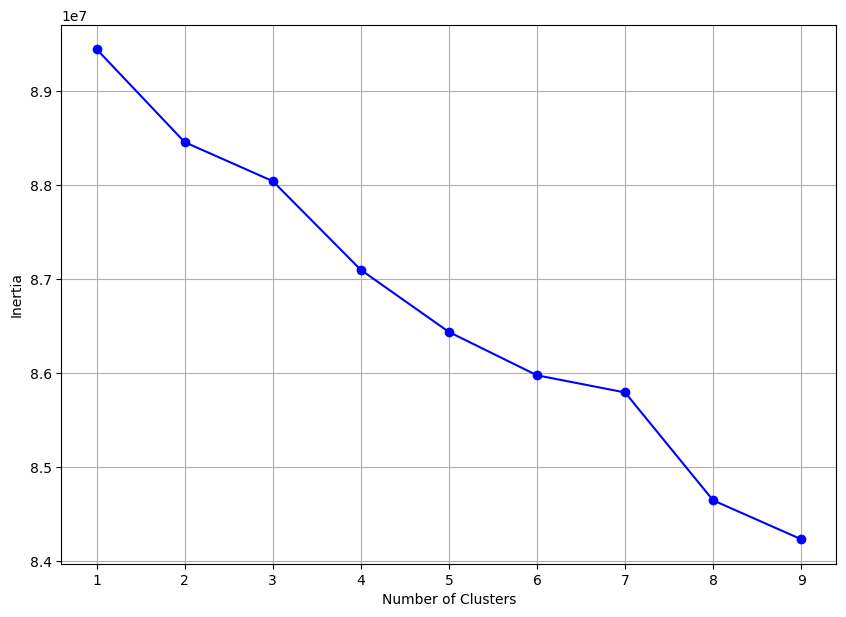

In [79]:
optimise_k_means(cluster_encode_data, 10)

In [80]:
kmeans = KMeans(n_clusters = 8,  random_state=10)
kmeans.fit(cluster_encode_data)
# Save cluster group as a column value in our data_frame
predicted_clusters = kmeans.labels_ 


In [81]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2 , random_state=9)

# Transform data (reduce dimension)
data_pca  = pca.fit_transform(cluster_encode_data)

In [82]:
data_pca.shape

(331415, 2)

In [84]:
# Prepare data
data_pca = pd.DataFrame(data_pca, columns=['Feature 1', 'Feature 2'])
data_pca['Predicted Clusters'] = predicted_clusters
data_pca['True Labels'] = severity_target_scaled
# Plotting the predicted clusters
fig1 = px.scatter(data_pca, x='Feature 1', y='Feature 2', color='Predicted Clusters',
                  color_continuous_scale=px.colors.sequential.Viridis, labels={'color': 'Predicted Cluster'},
                  title='Predicted Clusters')
fig1.update_layout(coloraxis_colorbar=dict(title="Predicted Clusters"))
fig1.show()